<a href="https://colab.research.google.com/github/Manojgharge07/Assignments/blob/main/Restaurant_Cuisines_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Restaurant Cuisines classification**

**Problem Statement:-**

Market contest and problem summary for restaurant records in the YELP business database, details on type of cuisine served are captured .When a cuisine type as not been captured for a particular restaurant , cuisine types are assigned best on key words in the business name ,this process was originally created on AS400 and recently migrated to BDBX .due to system limitations, The process only assigns 35 of the piece -100_ cuisine types   available in the YELP platform .in addition, these systems are only able to assign / stored one cuisine type per restaurant  where the YELP platform  allows the multiple .

**STRATEGY:**

Expand the cuisine assignment process to consider all 100_ supported cuisine type and assign multiple cuisine types where applicable.
Value propositions:
Proper and granular categorization of businesses is critical to many clients the best way to appropriately categorize restaurants is by identifying the cuisines served at each location.

**Expected Outcome:**

1-Updated keyword table 

2-Programatic assignment of all 100_cuisine types 

3-Programatic assignment of multiple cuisine types per restaurants.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
%matplotlib inline
import string
import nltk
from nltk.stem.porter import *
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.linear_model import LogisticRegression
from scipy import stats
from sklearn import metrics
import plotly.express as px

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/All CSV files/Datafiniti_Fast_Food_Restaurants_May19.csv")

In [ ]:
df.head()

,id,dateAdded,dateUpdated,address,categories,primaryCategories,city,country,keys,latitude,longitude,name,postalCode,province,sourceURLs,websites
0,AWrSh_KgsVYjT2BJAzaH,2019-05-19T23:58:05Z,2019-05-19T23:58:05Z,2555 11th Avenue,"Fast Food Restaurants,Hamburgers and Hot Dogs,...",Accommodation & Food Services,Greeley,US,us/co/greeley/255511thavenue/554191587,40.39629,-104.69699,Carl's Jr.,80631,CO,https://www.yellowpages.com/greeley-co/mip/car...,https://www.carlsjr.com/?utm_source=Yextandutm...
1,AWEKlA-LIxWefVJwxG9B,2018-01-18T18:30:23Z,2019-05-19T23:45:05Z,2513 Highway 6 And 50,"Restaurant,Mexican Restaurants,Fast Food Resta...",Accommodation & Food Services,Grand Junction,US,us/co/grandjunction/2513highway6and50/1550891556,39.08135,-108.58689,Del Taco,81505,CO,http://www.citysearch.com/profile/772076870/gr...,http://www.deltaco.com
2,AWrSfAcYsVYjT2BJAzPt,2019-05-19T23:45:04Z,2019-05-19T23:45:04Z,1125 Patterson Road,"Sandwich Shops,Fast Food Restaurants,Restauran...",Accommodation & Food Services,Grand Junction,US,us/co/grandjunction/1125pattersonroad/-2137447852,39.09148,-108.55411,Which Wich,81506,CO,https://www.yellowpages.com/grand-junction-co/...,http://www.whichwich.com
3,AWrSa3NAQTFama1Xpkbz,2019-05-19T23:26:58Z,2019-05-19T23:26:58Z,3455 N Salida Court,"Fast Food Restaurants,Mexican Restaurants,Rest...",Accommodation & Food Services,Aurora,US,us/co/aurora/3455nsalidacourt/1143321601,39.76369,-104.77671,Chipotle Mexican Grill,80011,CO,https://www.yellowpages.com/aurora-co/mip/chip...,http://www.chipotle.com
4,AWrSaVGzZ4Yw-wtdgcaB,2019-05-19T23:24:38Z,2019-05-19T23:24:38Z,5225 E Colfax Avenue,"Fast Food Restaurants,Mexican Restaurants,Rest...",Accommodation & Food Services,Denver,US,us/co/denver/5225ecolfaxavenue/-864103396,39.74044,-104.92636,Taco Bell,80220,CO,https://www.yellowpages.com/denver-co/mip/taco...,https://locations.tacobell.com/co/denver/5225-...


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 10000 non-null  object 
 1   dateAdded          10000 non-null  object 
 2   dateUpdated        10000 non-null  object 
 3   address            10000 non-null  object 
 4   categories         10000 non-null  object 
 5   primaryCategories  10000 non-null  object 
 6   city               10000 non-null  object 
 7   country            10000 non-null  object 
 8   keys               10000 non-null  object 
 9   latitude           10000 non-null  float64
 10  longitude          10000 non-null  float64
 11  name               10000 non-null  object 
 12  postalCode         10000 non-null  object 
 13  province           10000 non-null  object 
 14  sourceURLs         10000 non-null  object 
 15  websites           9918 non-null   object 
dtypes: float64(2), object(1

In [ ]:
df.columns

Index(['id', 'dateAdded', 'dateUpdated', 'address', 'categories',
       'primaryCategories', 'city', 'country', 'keys', 'latitude', 'longitude',
       'name', 'postalCode', 'province', 'sourceURLs', 'websites'],
      dtype='object')

In [ ]:
df.shape

(10000, 16)

In [ ]:
df.describe()

,latitude,longitude
count,10000.000000,10000.000000
mean,37.298215,-93.284547
std,5.566995,16.421424
min,19.639560,-159.464310
25%,33.850652,-98.342758
50%,37.490189,-86.677452
75%,40.808905,-81.803061
max,64.856880,-71.082180


In [ ]:
df.isnull().sum()

id                    0
dateAdded             0
dateUpdated           0
address               0
categories            0
primaryCategories     0
city                  0
country               0
keys                  0
latitude              0
longitude             0
name                  0
postalCode            0
province              0
sourceURLs            0
websites             82
dtype: int64

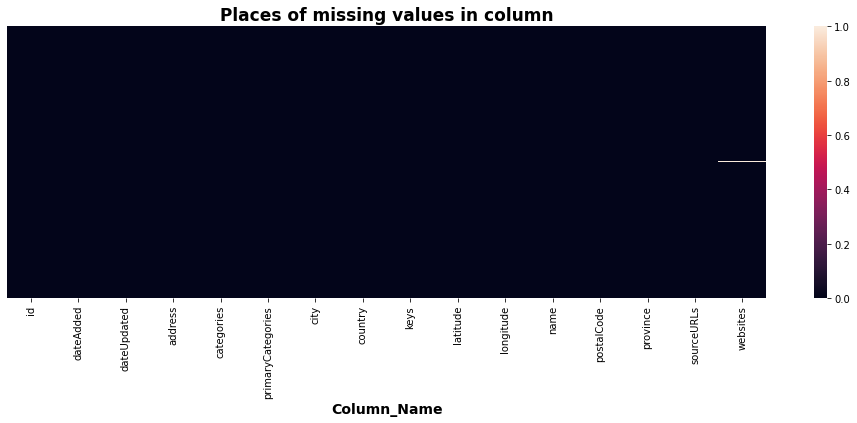

In [ ]:
plt.figure(figsize=(17, 5))
sns.heatmap(df.isnull(), cbar=True, yticklabels=False)
plt.xlabel("Column_Name", size=14, weight="bold")
plt.title("Places of missing values in column",fontweight="bold",size=17)
plt.show()

In [ ]:
df['city'].value_counts()

Columbus              105
Indianapolis           94
Birmingham             69
Cincinnati             60
Dayton                 59
                     ... 
Hilton Head Island      1
Rich Creek              1
Moneta                  1
Courtland               1
Nicholasville           1
Name: city, Length: 2810, dtype: int64

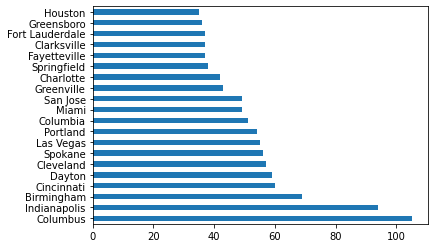

In [ ]:
df['city'].value_counts()[:20].plot(kind='barh')

In [ ]:
df['name'].value_counts()

McDonald's                          765
Subway                              667
SUBWAY                              543
Taco Bell                           529
Pizza Hut                           474
                                   ... 
Missouri Hick Barbeque                1
Dragon Golden Chinese Restaurant      1
Carolina Chicken Inc                  1
Four Eleven West to Go                1
Luxury Box                            1
Name: name, Length: 1545, dtype: int64

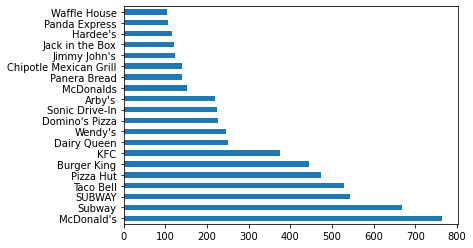

In [ ]:
df['name'].value_counts()[:20].plot(kind='barh')

In [ ]:
df['country'].value_counts()

US    10000
Name: country, dtype: int64

In [ ]:
df['postalCode'].value_counts()

37040         17
35601         15
46410         14
29418         13
46032         13
              ..
60641          1
27023          1
95492          1
60110          1
27707-2696     1
Name: postalCode, Length: 5310, dtype: int64

In [ ]:
df['province'].value_counts()

OH    922
FL    739
CA    727
NC    663
AL    635
IN    519
TX    426
WA    404
VA    348
OR    334
SC    322
IL    305
MO    244
TN    243
GA    238
MI    210
PA    194
AZ    186
NY    173
LA    161
WV    154
CO    154
OK    147
KY    142
AR    124
MD    114
WI    112
IA    107
MS     99
NV     96
KS     92
HI     91
MN     83
NE     74
UT     74
NM     69
ID     65
AK     64
MT     33
SD     27
DE     25
WY     20
DC     18
ND     18
MA      2
NJ      2
CT      1
Name: province, dtype: int64

In [ ]:
df['websites'].value_counts()

http://www.subway.com                                                                                                                 393
http://www.subway.com/                                                                                                                360
http://subway.com/                                                                                                                     84
http://www.subway.com,http://subway.com                                                                                                70
http://www.subway.com/,http://subway.com/                                                                                              65
                                                                                                                                     ... 
https://locations.bk.com/ms/jackson/5597-robinson-rd-ext.html,http://www.bk.com                                                         1
http://mcdonalds.com/,http://www.m

In [ ]:
df['sourceURLs'].value_counts()

https://www.yellowpages.com/greeley-co/mip/carls-jr-7001402                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   1
https://www.kudzu.com/m/Subway-21572375,http://www.kudzu.com/m/Subway-21572375,https://www.yellowpages.com/crest-hill-il/mip/subway-11331036                                                                                                                                                                                                                                                                                            

In [ ]:
df['categories'].value_counts()

Fast Food Restaurants,Hamburgers and Hot Dogs,Restaurants                                                                                                                                                                                 182
Fast Food                                                                                                                                                                                                                                 146
Ice Cream Parlors,Breakfast,Fast Food,Coffeehouses,Salads,Hamburgers,Restaurants,Sandwich Shops                                                                                                                                           140
Fast Food,Chicken,Restaurants                                                                                                                                                                                                              93
Fast Food Restaurants,Restaurants,Sandwich Shops

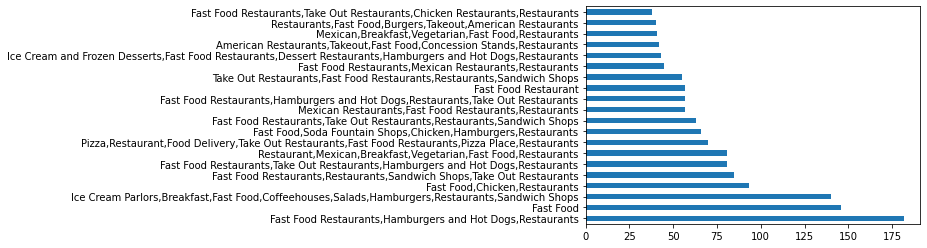

In [ ]:
df['categories'].value_counts()[:20].plot(kind='barh')

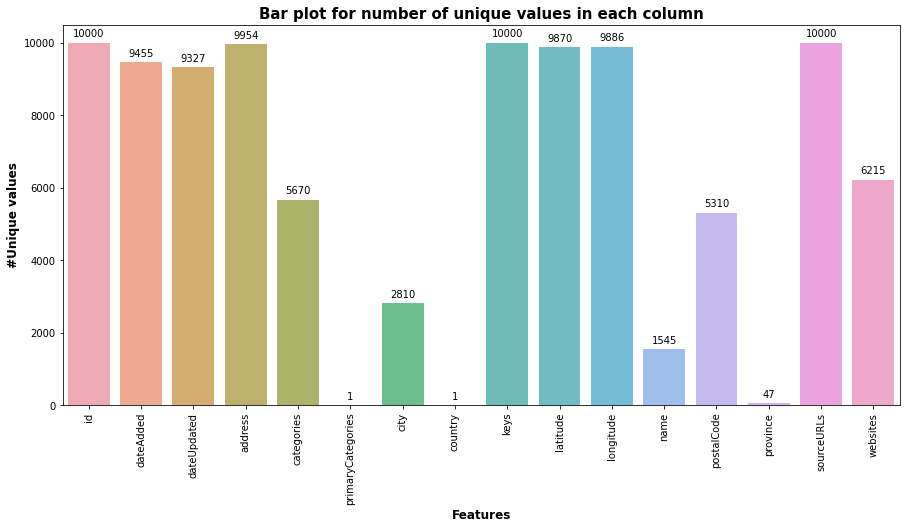

In [ ]:
unique_df = pd.DataFrame()
unique_df['Features'] = df.columns
unique=[]
for i in df.columns:
    unique.append(df[i].nunique())
unique_df['Uniques'] = unique

f, ax = plt.subplots(1,1, figsize=(15,7))

splot = sns.barplot(x=unique_df['Features'], y=unique_df['Uniques'], alpha=0.8)
for p in splot.patches:
    splot.annotate(format(p.get_height(), '.0f'), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center',
                   va = 'center', xytext = (0, 9), textcoords = 'offset points')
plt.title('Bar plot for number of unique values in each column',weight='bold', size=15)
plt.ylabel('#Unique values', size=12, weight='bold')
plt.xlabel('Features', size=12, weight='bold')
plt.xticks(rotation=90)
plt.show()

In [ ]:
df['new_categories'] = df['categories'].apply(lambda x : x.lower())

In [ ]:
df.head()

,id,dateAdded,dateUpdated,address,categories,primaryCategories,city,country,keys,latitude,longitude,name,postalCode,province,sourceURLs,websites,new_categories
0,AWrSh_KgsVYjT2BJAzaH,2019-05-19T23:58:05Z,2019-05-19T23:58:05Z,2555 11th Avenue,"Fast Food Restaurants,Hamburgers and Hot Dogs,...",Accommodation & Food Services,Greeley,US,us/co/greeley/255511thavenue/554191587,40.39629,-104.69699,Carl's Jr.,80631,CO,https://www.yellowpages.com/greeley-co/mip/car...,https://www.carlsjr.com/?utm_source=Yextandutm...,"fast food restaurants,hamburgers and hot dogs,..."
1,AWEKlA-LIxWefVJwxG9B,2018-01-18T18:30:23Z,2019-05-19T23:45:05Z,2513 Highway 6 And 50,"Restaurant,Mexican Restaurants,Fast Food Resta...",Accommodation & Food Services,Grand Junction,US,us/co/grandjunction/2513highway6and50/1550891556,39.08135,-108.58689,Del Taco,81505,CO,http://www.citysearch.com/profile/772076870/gr...,http://www.deltaco.com,"restaurant,mexican restaurants,fast food resta..."
2,AWrSfAcYsVYjT2BJAzPt,2019-05-19T23:45:04Z,2019-05-19T23:45:04Z,1125 Patterson Road,"Sandwich Shops,Fast Food Restaurants,Restauran...",Accommodation & Food Services,Grand Junction,US,us/co/grandjunction/1125pattersonroad/-2137447852,39.09148,-108.55411,Which Wich,81506,CO,https://www.yellowpages.com/grand-junction-co/...,http://www.whichwich.com,"sandwich shops,fast food restaurants,restauran..."
3,AWrSa3NAQTFama1Xpkbz,2019-05-19T23:26:58Z,2019-05-19T23:26:58Z,3455 N Salida Court,"Fast Food Restaurants,Mexican Restaurants,Rest...",Accommodation & Food Services,Aurora,US,us/co/aurora/3455nsalidacourt/1143321601,39.76369,-104.77671,Chipotle Mexican Grill,80011,CO,https://www.yellowpages.com/aurora-co/mip/chip...,http://www.chipotle.com,"fast food restaurants,mexican restaurants,rest..."
4,AWrSaVGzZ4Yw-wtdgcaB,2019-05-19T23:24:38Z,2019-05-19T23:24:38Z,5225 E Colfax Avenue,"Fast Food Restaurants,Mexican Restaurants,Rest...",Accommodation & Food Services,Denver,US,us/co/denver/5225ecolfaxavenue/-864103396,39.74044,-104.92636,Taco Bell,80220,CO,https://www.yellowpages.com/denver-co/mip/taco...,https://locations.tacobell.com/co/denver/5225-...,"fast food restaurants,mexican restaurants,rest..."


In [ ]:
# what types of category do we have for primary categories?
df['primaryCategories'].value_counts()

Accommodation & Food Services    10000
Name: primaryCategories, dtype: int64

In [ ]:
# drop primaryCategory column
df = df.drop(['primaryCategories'], axis=1)

# shape of dataset
print("Dimension after dropping columns:")
print(df.shape)

# take a peek at the head to verify the drop is successful
df.head()

Dimension after dropping columns:
(10000, 16)


,id,dateAdded,dateUpdated,address,categories,city,country,keys,latitude,longitude,name,postalCode,province,sourceURLs,websites,new_categories
0,AWrSh_KgsVYjT2BJAzaH,2019-05-19T23:58:05Z,2019-05-19T23:58:05Z,2555 11th Avenue,"Fast Food Restaurants,Hamburgers and Hot Dogs,...",Greeley,US,us/co/greeley/255511thavenue/554191587,40.39629,-104.69699,Carl's Jr.,80631,CO,https://www.yellowpages.com/greeley-co/mip/car...,https://www.carlsjr.com/?utm_source=Yextandutm...,"fast food restaurants,hamburgers and hot dogs,..."
1,AWEKlA-LIxWefVJwxG9B,2018-01-18T18:30:23Z,2019-05-19T23:45:05Z,2513 Highway 6 And 50,"Restaurant,Mexican Restaurants,Fast Food Resta...",Grand Junction,US,us/co/grandjunction/2513highway6and50/1550891556,39.08135,-108.58689,Del Taco,81505,CO,http://www.citysearch.com/profile/772076870/gr...,http://www.deltaco.com,"restaurant,mexican restaurants,fast food resta..."
2,AWrSfAcYsVYjT2BJAzPt,2019-05-19T23:45:04Z,2019-05-19T23:45:04Z,1125 Patterson Road,"Sandwich Shops,Fast Food Restaurants,Restauran...",Grand Junction,US,us/co/grandjunction/1125pattersonroad/-2137447852,39.09148,-108.55411,Which Wich,81506,CO,https://www.yellowpages.com/grand-junction-co/...,http://www.whichwich.com,"sandwich shops,fast food restaurants,restauran..."
3,AWrSa3NAQTFama1Xpkbz,2019-05-19T23:26:58Z,2019-05-19T23:26:58Z,3455 N Salida Court,"Fast Food Restaurants,Mexican Restaurants,Rest...",Aurora,US,us/co/aurora/3455nsalidacourt/1143321601,39.76369,-104.77671,Chipotle Mexican Grill,80011,CO,https://www.yellowpages.com/aurora-co/mip/chip...,http://www.chipotle.com,"fast food restaurants,mexican restaurants,rest..."
4,AWrSaVGzZ4Yw-wtdgcaB,2019-05-19T23:24:38Z,2019-05-19T23:24:38Z,5225 E Colfax Avenue,"Fast Food Restaurants,Mexican Restaurants,Rest...",Denver,US,us/co/denver/5225ecolfaxavenue/-864103396,39.74044,-104.92636,Taco Bell,80220,CO,https://www.yellowpages.com/denver-co/mip/taco...,https://locations.tacobell.com/co/denver/5225-...,"fast food restaurants,mexican restaurants,rest..."


In [ ]:
# let's split the categories string data by ","
#categories = df['categories'].values
#for i in range(len(categories)):
#    categories[i] = categories[i].split(",")

In [ ]:
# update the "categories" column in the fastfood_data
#df['categories'] = categories
#df.head()

,id,dateAdded,dateUpdated,address,categories,city,country,keys,latitude,longitude,name,postalCode,province,sourceURLs,websites,new_categories
0,AWrSh_KgsVYjT2BJAzaH,2019-05-19T23:58:05Z,2019-05-19T23:58:05Z,2555 11th Avenue,"[Fast Food Restaurants, Hamburgers and Hot Dog...",Greeley,US,us/co/greeley/255511thavenue/554191587,40.39629,-104.69699,Carl's Jr.,80631,CO,https://www.yellowpages.com/greeley-co/mip/car...,https://www.carlsjr.com/?utm_source=Yextandutm...,"fast food restaurants,hamburgers and hot dogs,..."
1,AWEKlA-LIxWefVJwxG9B,2018-01-18T18:30:23Z,2019-05-19T23:45:05Z,2513 Highway 6 And 50,"[Restaurant, Mexican Restaurants, Fast Food Re...",Grand Junction,US,us/co/grandjunction/2513highway6and50/1550891556,39.08135,-108.58689,Del Taco,81505,CO,http://www.citysearch.com/profile/772076870/gr...,http://www.deltaco.com,"restaurant,mexican restaurants,fast food resta..."
2,AWrSfAcYsVYjT2BJAzPt,2019-05-19T23:45:04Z,2019-05-19T23:45:04Z,1125 Patterson Road,"[Sandwich Shops, Fast Food Restaurants, Restau...",Grand Junction,US,us/co/grandjunction/1125pattersonroad/-2137447852,39.09148,-108.55411,Which Wich,81506,CO,https://www.yellowpages.com/grand-junction-co/...,http://www.whichwich.com,"sandwich shops,fast food restaurants,restauran..."
3,AWrSa3NAQTFama1Xpkbz,2019-05-19T23:26:58Z,2019-05-19T23:26:58Z,3455 N Salida Court,"[Fast Food Restaurants, Mexican Restaurants, R...",Aurora,US,us/co/aurora/3455nsalidacourt/1143321601,39.76369,-104.77671,Chipotle Mexican Grill,80011,CO,https://www.yellowpages.com/aurora-co/mip/chip...,http://www.chipotle.com,"fast food restaurants,mexican restaurants,rest..."
4,AWrSaVGzZ4Yw-wtdgcaB,2019-05-19T23:24:38Z,2019-05-19T23:24:38Z,5225 E Colfax Avenue,"[Fast Food Restaurants, Mexican Restaurants, R...",Denver,US,us/co/denver/5225ecolfaxavenue/-864103396,39.74044,-104.92636,Taco Bell,80220,CO,https://www.yellowpages.com/denver-co/mip/taco...,https://locations.tacobell.com/co/denver/5225-...,"fast food restaurants,mexican restaurants,rest..."


In [ ]:
df['categories'].head(50)

0     Fast Food Restaurants,Hamburgers and Hot Dogs,...
1     Restaurant,Mexican Restaurants,Fast Food Resta...
2     Sandwich Shops,Fast Food Restaurants,Restauran...
3     Fast Food Restaurants,Mexican Restaurants,Rest...
4     Fast Food Restaurants,Mexican Restaurants,Rest...
5     Fast Food Restaurants,Hamburgers and Hot Dogs,...
6     Fast Food Restaurants,Hamburgers and Hot Dogs,...
7     Restaurant,Carry-out food,Mexican Restaurants,...
8     Fast Food Restaurants,American Restaurants,Fam...
9     Mexican Restaurants,Caterers,Greek Restaurants...
10    Fast Food Restaurants,American Restaurants,Bar...
11    Burger Joint,American Restaurants,Breakfast,Am...
12    Mexican Restaurants,Fast Food Restaurants,Take...
13    Grill Restaurants,Mexican,Mexican Restaurants,...
14    Burger Joint,Restaurant,Fast Food Restaurant a...
15    Hamburgers & Hot Dogs,Restaurant,Carry-out foo...
16    Carry-out food,Hotels and motels,Hotel and mot...
17    Carry-out food,Mexican Restaurants,Tex-mex

In [ ]:
df['categories'].iloc[50:100]

50    Take Out Restaurants,Fast Food Restaurants,Chi...
51     Fast Food Restaurants,Restaurants,Sandwich Shops
52    American Restaurants,Hot Dog Stands and Restau...
53    Breakfast Brunch and Lunch Restaurants,Fast Fo...
54    Fast Food Restaurants,American Restaurants,Chi...
55    Fast Food Restaurants,Hamburgers and Hot Dogs,...
56    American Restaurants,Breakfast Brunch and Lunc...
57    Hamburgers & Hot Dogs,Breakfast Brunch and Lun...
58    Breakfast Brunch and Lunch Restaurants,Fast Fo...
59    Asian Restaurants,Restaurant,Carry-out food,Th...
60    Food and Beverage Delivery,Carry-out food,Cate...
61    Pizza,Italian Restaurant,Caterers,Italian Groc...
62    Restaurant,American Restaurants,Hot Dog Stands...
63    Hamburgers & Hot Dogs,Breakfast Brunch and Lun...
64    Breakfast Brunch and Lunch Restaurants,Fast Fo...
65                    Fast Food Restaurants,Restaurants
66    Carry Out Food,Ice Cream and Frozen Desserts,F...
67    Breakfast Brunch and Lunch Restaurants,Fas

In [ ]:
df['categories'].iloc[101:150]

101    Breakfast Brunch and Lunch Restaurants,Carry-o...
102    Fast Food Restaurants,Dessert Restaurants,Hamb...
103    Delis And Delicatessens,Carry-out food,Delicat...
104    Carry Out Food,Asian Restaurants,Japanese Rest...
105    Fast Food Restaurants,Hamburgers and Hot Dogs,...
106    Fast Food,Fast Food Restaurants,Hamburgers and...
107    Fast Food Restaurants,American Restaurants,Chi...
108    American Restaurants,Carry-out food,Mexican Re...
109    Restaurant,Hot dog restaurants,Fast Food Resta...
110    Carry-out food,Caterers,Mexican Restaurants,Te...
111    American Restaurants,Hot Dog Stands and Restau...
112    Carry-out food,Restaurant,Caterers,Delicatesse...
113    Restaurant,Fast Food Restaurants,Take Out Rest...
114    Pizza,Restaurant,Food Delivery,Take Out Restau...
115    Breakfast Brunch and Lunch Restaurants,America...
116    Carry-out food,Restaurant delivery service,Cat...
117    Breakfast Brunch and Lunch Restaurants,Carry-o...
118    Delis And Delicatessens,

In [ ]:
df.categories.tolist

<bound method IndexOpsMixin.tolist of 0       Fast Food Restaurants,Hamburgers and Hot Dogs,...
1       Restaurant,Mexican Restaurants,Fast Food Resta...
2       Sandwich Shops,Fast Food Restaurants,Restauran...
3       Fast Food Restaurants,Mexican Restaurants,Rest...
4       Fast Food Restaurants,Mexican Restaurants,Rest...
                              ...                        
9995    American Restaurants,Caterers,Soul Food Restau...
9996    Mexican Restaurants,Caterers,Delicatessens,Iri...
9997    Carry-out food,Hot dog restaurants,Fast Food R...
9998    Carry-out food,Caterers,Restaurant delivery se...
9999                     Fast Food Restaurant,Restaurants
Name: categories, Length: 10000, dtype: object>

In [ ]:
# top 50 most appeared restaurants in the dataset and their corresponding category
top50_name_by_number = df['name'].value_counts()[:50].index.tolist()
top50_rest_categories = []
for name in top50_name_by_number:
    category = df[df.name == name]["categories"][:1].values[0]
    top50_rest_categories.append(category)

In [ ]:
# remove stopword "Restaurants", "Restaurant", and "Fast Food Restaurants" in categories
stopwords = ["Fast Food Restaurants","Fast Food restaurants", "Fast Food", "Restaurants", "Restaurant", "restaurants", "restaurant"]
for i in range(len(top50_rest_categories)):
    for j in range(len(top50_rest_categories[i])):
        word = top50_rest_categories[i][j]
        # remove stopword as the only word given
        for stopword in stopwords:
            isRemoved = False
            if isRemoved == False and word == stopword:
                top50_rest_categories[i][j] = top50_rest_categories[i][j].replace(stopword, "")
                isRemoved = True

        # replace the stopword within a group of words
        for stopword in stopwords:
            if isRemoved == False and stopword in word:
                top50_rest_categories[i][j] = top50_rest_categories[i][j].replace(stopword, "")

In [ ]:
top50_rest_categories

['Fast Food Restaurants,Hamburgers and Hot Dogs,Restaurants,Take Out Restaurants',
 'Delis And Delicatessens,Restaurant,Carry-out food,Caterers,Delicatessens,American restaurants,Take Out Restaurants,Fast Food Restaurants,Sandwiches,Catering,Restaurants,Sandwich Shops',
 'Delis And Delicatessens,Restaurant,Carry-out food,Delicatessens,wich Place,Take Out Restaurants,Fast Food Restaurants,Sandwiches,Restaurants,Sandwich Shops',
 'Fast Food Restaurants,Mexican Restaurants,Restaurants',
 'Pizza,Carry-out food,Caterers,Restaurant delivery service,American restaurants,Take Out Restaurants,Fast Food Restaurants,Home delivery beer and beverages,Family Style Restaurants,Catering,Restaurants',
 'Burger Joint,Restaurant,Fast Food Restaurant and Burger Joint Pleasant Valley,Hot dog restaurants,Fast Food Restaurant,Hamburger restaurants,Fast Food Restaurant and Burger Joint,Fast food restaurants,Restaurants',
 'Fast Food,Chicken,Restaurants',
 'Carry Out Food,Ice Cream and Frozen Desserts,Fast Foo

In [ ]:
from wordcloud import WordCloud

# empty string is declare 
text = "" 

# iterating through list of rows 
for row in top50_rest_categories : 
    # iterating through words in the row 
    for word in row:
        if len(word) == 0:
            continue
        # concatenate the words 
        if word[-1] == " ":
            word = word[:-1] # remove the last space character
        text = text + " " + word.replace(" ", "_") 
print("Vocabulary of our processed categories data:\n")
print(text)

Vocabulary of our processed categories data:

 F a s t  F o o d  R e s t a u r a n t s , H a m b u r g e r s  a n d  H o t  D o g s , R e s t a u r a n t s , T a k e  O u t  R e s t a u r a n t s D e l i s  A n d  D e l i c a t e s s e n s , R e s t a u r a n t , C a r r y - o u t  f o o d , C a t e r e r s , D e l i c a t e s s e n s , A m e r i c a n  r e s t a u r a n t s , T a k e  O u t  R e s t a u r a n t s , F a s t  F o o d  R e s t a u r a n t s , S a n d w i c h e s , C a t e r i n g , R e s t a u r a n t s , S a n d w i c h  S h o p s D e l i s  A n d  D e l i c a t e s s e n s , R e s t a u r a n t , C a r r y - o u t  f o o d , D e l i c a t e s s e n s , w i c h  P l a c e , T a k e  O u t  R e s t a u r a n t s , F a s t  F o o d  R e s t a u r a n t s , S a n d w i c h e s , R e s t a u r a n t s , S a n d w i c h  S h o p s F a s t  F o o d  R e s t a u r a n t s , M e x i c a n  R e s t a u r a n t s , R e s t a u r a n t s P i z z a , C a r r y - o u t  f o o d , C 

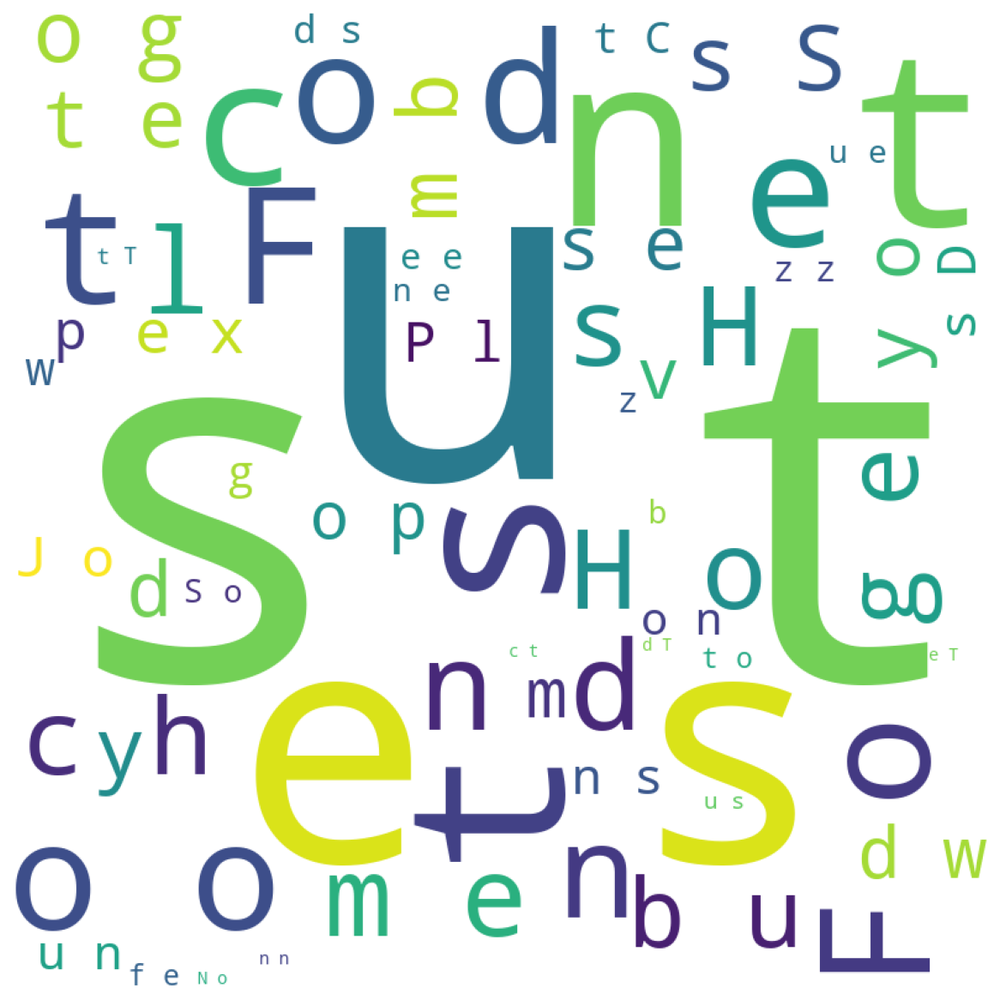

In [ ]:
# generate wordcloud
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white',
                min_font_size = 10).generate(text) 
  
# plot the WordCloud image                        
plt.figure(figsize = (16, 16), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
plt.show()

Number of unique cities: 2810


Text(0, 0.5, 'count')

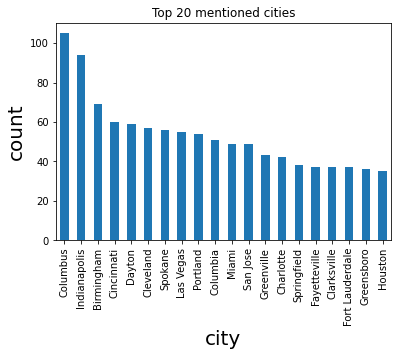

In [ ]:
# top 20 fast food populated cities recorded by count total
print("Number of unique cities:", df['city'].nunique())
nameplot = df['city'].value_counts()[:20].plot.bar(title='Top 20 mentioned cities')
nameplot.set_xlabel('city',size=20)
nameplot.set_ylabel('count',size=20)

In [ ]:
# let's run pandas' .descirbe() function 
rest_count_by_city = df['city'].value_counts()
rest_count_by_city.describe()

count    2810.000000
mean        3.558719
std         6.260422
min         1.000000
25%         1.000000
50%         2.000000
75%         3.000000
max       105.000000
Name: city, dtype: float64

In [ ]:
print(len(rest_count_by_city[rest_count_by_city < 4]), "cities opened less than 4 fast food restaurants")
print("They are", round(100*len(rest_count_by_city[rest_count_by_city < 4])/len(rest_count_by_city),2), "%"),
print("of the total cities recorded in the dataset")

2121 cities opened less than 4 fast food restaurants
They are 75.48 %
of the total cities recorded in the dataset


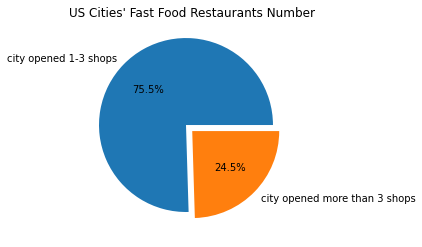

In [ ]:
# plot pie chart
fig, ax = plt.subplots()
total_cities_with_less_than_4_rests = len(rest_count_by_city[rest_count_by_city < 4])
total_cities_with_greater_equal_4_rests = df['city'].nunique() - total_cities_with_less_than_4_rests
values = [total_cities_with_less_than_4_rests, total_cities_with_greater_equal_4_rests]
ax.pie(values, 
       labels=["city opened 1-3 shops", "city opened more than 3 shops"], autopct='%.1f%%', radius=1, 
       explode = (0.1, 0))
ax.set_aspect('equal')
ax.set_title("US Cities' Fast Food Restaurants Number")
plt.show()

In [ ]:
# input 2 letter code name for easier conversion
us_state_names = pd.read_csv('/content/drive/MyDrive/All CSV files/csvData.csv')
us_state_names.head()

,State,Abbrev,Code
0,Alabama,Ala.,AL
1,Alaska,Alaska,AK
2,Arizona,Ariz.,AZ
3,Arkansas,Ark.,AR
4,California,Calif.,CA


In [ ]:
us_state_names.columns

Index(['State', 'Abbrev', 'Code'], dtype='object')

In [ ]:
# convert the names of the states
def convert_state_names(Code):
    return us_state_names[us_state_names['Code']== Code].values[0][0]

# use the above function to convert code to name
df['province_full'] = ""
state_names = [None] * len(df['province'].values)
state_codes = df['province'].values
for i in range(len(state_codes)):
    state_names[i] = convert_state_names(state_codes[i])
print(state_names[:20])

# # let's replace the province column values with full state names
df['province_full'] = state_names

['Colorado', 'Colorado', 'Colorado', 'Colorado', 'Colorado', 'Colorado', 'Colorado', 'Arkansas', 'Colorado', 'Colorado', 'Colorado', 'Colorado', 'Colorado', 'Colorado', 'Arkansas', 'Arkansas', 'Alaska', 'Alaska', 'Alaska', 'Alaska']


In [ ]:
df['province'].value_counts()

OH    922
FL    739
CA    727
NC    663
AL    635
IN    519
TX    426
WA    404
VA    348
OR    334
SC    322
IL    305
MO    244
TN    243
GA    238
MI    210
PA    194
AZ    186
NY    173
LA    161
WV    154
CO    154
OK    147
KY    142
AR    124
MD    114
WI    112
IA    107
MS     99
NV     96
KS     92
HI     91
MN     83
NE     74
UT     74
NM     69
ID     65
AK     64
MT     33
SD     27
DE     25
WY     20
DC     18
ND     18
MA      2
NJ      2
CT      1
Name: province, dtype: int64

In [ ]:
df['province'].head()

0    CO
1    CO
2    CO
3    CO
4    CO
Name: province, dtype: object

Number of unique provinces: 47


Text(0, 0.5, 'count')

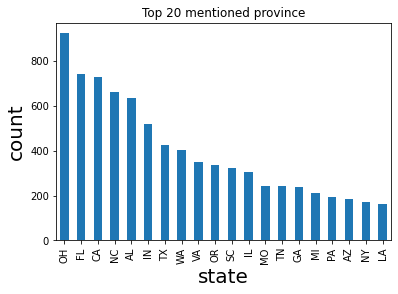

In [ ]:
# top 20 fast food populated states recorded by count total
print("Number of unique provinces:", df['province'].nunique())
nameplot = df['province'].value_counts()[:20].plot.bar(title='Top 20 mentioned province')
nameplot.set_xlabel('state',size=20) # changed the label to state; it's the US
nameplot.set_ylabel('count',size=20)

In [ ]:
df['province'].value_counts().describe()

count     47.000000
mean     212.765957
std      220.791877
min        1.000000
25%       71.500000
50%      142.000000
75%      274.500000
max      922.000000
Name: province, dtype: float64

In [ ]:
df['province'].value_counts()[df['province'].value_counts() == 1]

CT    1
Name: province, dtype: int64

In [ ]:
# get top 3 fast food populated cities
top3_fastfood_populated_cities = df['city'].value_counts()[:3].index.tolist()
top3_fastfood_populated_cities[:3]

['Columbus', 'Indianapolis', 'Birmingham']

In [ ]:
# take a look at the restaurant numbers
df[df["city"]=="Columbus"]["name"].value_counts()

SUBWAY                               13
Subway                                8
McDonald's                            7
Pizza Hut                             6
Chipotle Mexican Grill                6
Panera Bread                          3
Domino's Pizza                        3
Dairy Queen                           3
Arby's                                2
Waffle House                          2
Bob Evans                             2
Wendy's                               2
WG Grinders                           2
Churchs Chicken                       2
Moe's Southwest Grill                 2
Panda Express                         2
McDonalds                             2
Jam Restaurants                       1
1 Gyro Shoppe                         1
Church's Chicken                      1
Hunan Lion Gourmet Chinese            1
Jerry's Subs and Pizza                1
Hunan House                           1
Jersey Mike's Subs                    1
Acropolis Gyro Palace                 1


In [ ]:
# get the restaurant number count by unique restaurant name
def get_restaurants_counts(city_name):
    return df[df["city"]==city_name]["name"].value_counts()

# print the restaurants that opened more than 1 shop
def print_more_than_1_shop_rest(restaurants, city_name):
    more_than_1_shops = restaurants[restaurants > 1]
    print("\nAmong", len(restaurants), "unique fastfood restaurant brands in", city_name+",")
    print(len(more_than_1_shops), "brands opened more than 1 shops.")
    print("They occupied", str(round(len(more_than_1_shops)/sum(restaurants)*100,2))+
          "% of total restaurants by number")
    print(more_than_1_shops)

In [ ]:
# let's generate a quick summary of the shops
for city in top3_fastfood_populated_cities:
    print_more_than_1_shop_rest(get_restaurants_counts(city), city)


Among 55 unique fastfood restaurant brands in Columbus,
17 brands opened more than 1 shops.
They occupied 16.19% of total restaurants by number
SUBWAY                    13
Subway                     8
McDonald's                 7
Pizza Hut                  6
Chipotle Mexican Grill     6
Panera Bread               3
Domino's Pizza             3
Dairy Queen                3
Arby's                     2
Waffle House               2
Bob Evans                  2
Wendy's                    2
WG Grinders                2
Churchs Chicken            2
Moe's Southwest Grill      2
Panda Express              2
McDonalds                  2
Name: name, dtype: int64

Among 53 unique fastfood restaurant brands in Indianapolis,
19 brands opened more than 1 shops.
They occupied 20.21% of total restaurants by number
Pizza Hut                  8
Dairy Queen                6
SUBWAY                     5
Jimmy John's               4
Steak 'n Shake             4
Church's Chicken           4
Domino's Pizza

In [ ]:
# reusable function to create data needed for plotting pie chart
def create_pie_chart_data(city_name):
    counts =  df[df["city"]==city_name]["name"].value_counts()[:10].values
    labels = df[df["city"]==city_name]["name"].value_counts().index.tolist()[:10]
    return counts, labels

In [ ]:
# reusable function to plot pie chart for our EDA
def plot_pie_chart(counts, labels, city_name):
    fig, ax = plt.subplots()
    ax.pie(counts, labels=labels, autopct='%.1f%%', radius=1.1, 
          explode = (0.1, 0, 0, 0, 0, 0, 0, 0, 0, 0))
    ax.set_aspect('equal')
    ax.set_title("Top 10 Restaurants in " + city_name)
    plt.show()

['SUBWAY', 'Subway', "McDonald's"] are the top 3 populated restaurants in Columbus


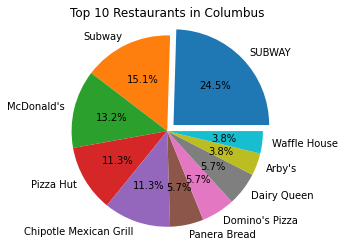

['Pizza Hut', 'Dairy Queen', 'SUBWAY'] are the top 3 populated restaurants in Indianapolis


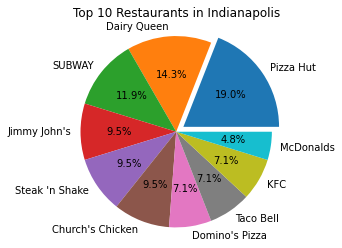

["McDonald's", 'Subway', "Jimmy John's"] are the top 3 populated restaurants in Birmingham


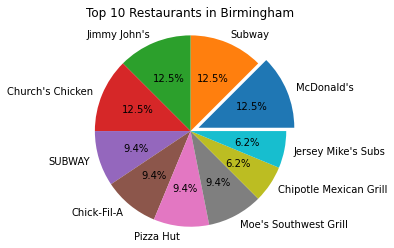

In [ ]:
# for each city, let's create the data needed and plot them in pie chart
for city in top3_fastfood_populated_cities:
    counts, labels = create_pie_chart_data(city)
    print(labels[:3], "are the top 3 populated restaurants in", city)
    plot_pie_chart(counts, labels, city)

In [ ]:
from plotly.offline import init_notebook_mode, iplot
from plotly.graph_objs import *
init_notebook_mode(connected=True)
import plotly.graph_objs as go

In [ ]:
# create data needed
state_codes = df['province'].value_counts().index.tolist()
value_counts_by_states = df['province'].value_counts()

# plotly choropleth
data= [dict(type='choropleth',
            locations = state_codes, # Spatial coordinates
            z = value_counts_by_states, # Data to be color-coded
            locationmode = 'USA-states', # set of locations match entries in `locations`
            colorscale = 'Reds',
            marker_line_color = 'white',
            colorbar_title = "Number of Fast Fast Restaurants"
        )]
layout = dict(title = '2019 US Fast Food Restaurants by State', 
              geo = dict(scope='usa'))
iplot(dict(data=data, layout=layout))

In [ ]:
data = [dict(type = 'scattergeo',
            locationmode = 'USA-states',
            lon = df['longitude'],
            lat = df['latitude'],
            mode = 'markers',
            marker = dict(size = 3,
                opacity = 0.7,
                reversescale = True,
                autocolorscale = False,
                symbol = 'circle',
                line = dict(width=.5, color='black'),
                color = 'red'
            )
        )]

layout = dict(title = '2019 US Fast Food Restaurants by GPS location',
            geo = dict(scope='usa',
                showland = True,
                landcolor = "rgb(250, 250, 250)",
                subunitcolor = "rgb(217, 217, 217)"
            )
        )
iplot(dict(data=data, layout=layout ))

In [ ]:
#mapping: Analysis of the Latitiude and Longitude
# Explore the pickup latitude and longitudes
df['latitude'].describe()

count    10000.000000
mean        37.298215
std          5.566995
min         19.639560
25%         33.850652
50%         37.490189
75%         40.808905
max         64.856880
Name: latitude, dtype: float64

In [ ]:
df['longitude'].describe()

count    10000.000000
mean       -93.284547
std         16.421424
min       -159.464310
25%        -98.342758
50%        -86.677452
75%        -81.803061
max        -71.082180
Name: longitude, dtype: float64

In [ ]:
!pip install geopandas
!pip install Shapely
!pip install matplotlib

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from datetime import timedelta
#!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

#!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

In [ ]:
address = 'US'

geolocator = Nominatim(user_agent="tr_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of US are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of US are 39.7837304, -100.445882.


In [ ]:
# create map of Toronto using latitude and longitude values
map_bng = folium.Map(location=[latitude, longitude], zoom_start=9)

# add markers to map
for latitude, longitude, address, city in zip(df['latitude'], df['longitude'], df['address'], df['city']):
    label = '{}, {}'.format(address, city)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [latitude, longitude],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_bng)  
    
map_bng

In [ ]:
from plotly.offline import init_notebook_mode, iplot
from plotly.graph_objs import *
init_notebook_mode(connected=True)
import plotly.graph_objs as go

In [ ]:
# create data needed
city_codes = df['province'].value_counts().index.tolist()
value_counts_by_city = df['province'].value_counts()

# plotly choropleth
data= [dict(type='choropleth',
            locations = city_codes, # Spatial coordinates
            z = value_counts_by_city, # Data to be color-coded
            locationmode = 'USA-states', # set of locations match entries in `locations`
            colorscale = 'Reds',
            marker_line_color = 'white',
            colorbar_title = "Number of Fast Fast Restaurants"
        )]
layout = dict(title = '2019 US Fast Food Restaurants by State', 
              geo = dict(scope='usa'))
iplot(dict(data=data, layout=layout))

plt.show()

In [ ]:
# create data needed
state_codes = df['province'].value_counts().index.tolist()
value_counts_by_states = df['province'].value_counts()

# plotly choropleth
data= [dict(type='choropleth',
            locations = state_codes, # Spatial coordinates
            z = value_counts_by_states, # Data to be color-coded
            locationmode = 'USA-states', # set of locations match entries in `locations`
            colorscale = 'Reds',
            marker_line_color = 'white',
            colorbar_title = "Number of Fast Fast Restaurants"
        )]
layout = dict(title = '2019 US Fast Food Restaurants by State', 
              geo = dict(scope='usa'))
iplot(dict(data=data, layout=layout))

In [ ]:
data = [dict(type = 'scattergeo',
            locationmode = 'USA-states',
            lon = df['longitude'],
            lat = df['latitude'],
            mode = 'markers',
            marker = dict(size = 3,
                opacity = 0.7,
                reversescale = True,
                autocolorscale = False,
                symbol = 'circle',
                line = dict(width=.5, color='black'),
                color = 'red'
            )
        )]

layout = dict(title = '2019 US Fast Food Restaurants by GPS location',
            geo = dict(scope='usa',
                showland = True,
                landcolor = "rgb(250, 250, 250)",
                subunitcolor = "rgb(217, 217, 217)"
            )
        )
iplot(dict(data=data, layout=layout ))

plt.show()

In [ ]:
# import folium package
import folium
 
mark = folium.Map(location = [39.7837304, -100.445882],zoom_start = 12)
#folium.Marker(location = [39.7837304, -100.445882]).add_to(mark)
#mark

In [ ]:
for i in range(0,len(df.head(500))):
    folium.Marker([df.iloc[i]['latitude'], df.iloc[i]['longitude']]).add_to(mark)
mark

# Day-2

In [ ]:
# address, city, country, lattitude, longitude, name, postal code, province, website
df["detailed_address"] = df["name"] + df["address"]+  df["city"] + df["country"]+ df["latitude"].astype(str) + df["longitude"].astype(str)+ df["postalCode"] +["province"]

In [ ]:
df1 = df[["detailed_address","categories"]]
df1.head()

,detailed_address,categories
0,Carl's Jr.2555 11th AvenueGreeleyUS40.39629-10...,"Fast Food Restaurants,Hamburgers and Hot Dogs,..."
1,Del Taco2513 Highway 6 And 50Grand JunctionUS3...,"Restaurant,Mexican Restaurants,Fast Food Resta..."
2,Which Wich1125 Patterson RoadGrand JunctionUS3...,"Sandwich Shops,Fast Food Restaurants,Restauran..."
3,Chipotle Mexican Grill3455 N Salida CourtAuror...,"Fast Food Restaurants,Mexican Restaurants,Rest..."
4,Taco Bell5225 E Colfax AvenueDenverUS39.74044-...,"Fast Food Restaurants,Mexican Restaurants,Rest..."


In [ ]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 2 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   detailed_address  10000 non-null  object
 1   categories        10000 non-null  object
dtypes: object(2)
memory usage: 156.4+ KB


In [ ]:
df1["categories"] = df1["categories"].map(lambda x: x.lower())
df1.head()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,detailed_address,categories
0,Carl's Jr.2555 11th AvenueGreeleyUS40.39629-10...,"fast food restaurants,hamburgers and hot dogs,..."
1,Del Taco2513 Highway 6 And 50Grand JunctionUS3...,"restaurant,mexican restaurants,fast food resta..."
2,Which Wich1125 Patterson RoadGrand JunctionUS3...,"sandwich shops,fast food restaurants,restauran..."
3,Chipotle Mexican Grill3455 N Salida CourtAuror...,"fast food restaurants,mexican restaurants,rest..."
4,Taco Bell5225 E Colfax AvenueDenverUS39.74044-...,"fast food restaurants,mexican restaurants,rest..."


In [ ]:
#remove pattern in the input text:
def remove_pattern(input_txt, pattern):
  r = re.findall(pattern, input_txt)
  for i in r:
    input_txt = re.sub(i,"",input_txt)
  return input_txt

In [ ]:
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'restaurants')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'carry-out food')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'karaoke')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'take out')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'caterers')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'family style restaurants')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'delicatessens')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'restaurant')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'home delivery beer and beverages')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'delivery service')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'sports bar')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'family style')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'place')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], '&')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], "women's clothing")
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'bars')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'southwestern')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'joint')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'hotel and motel reservations')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'banquet halls & reception facilities')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'delis')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'service stations')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'stands')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'fraternal organizations')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'tourism')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'shops')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'cocktail lounges')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'cypress station')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'family friendly')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'convenience stores')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'bar and grills')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'food delivery')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'manufacturers')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'clubs')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'pubs')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'takeout')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'airport')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'full service')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'devonshire')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'youngstown')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'yuma')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'shops')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'restaurant delivery service')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'southwestern restaurants')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'ale')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'ale-wholesale')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'distributors')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' american canoga park')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'barbecued poultry')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'frozen desserts')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'wine')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'shop')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'stores')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'catering')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], '')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'wilmington')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'willard ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' -retail')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' -wholes')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' -')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'wi-fi hotspots')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'caterer')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'spare rib ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' american  cape fear')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' american  downtown beaverton')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' american  downtown blacksburg')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' american  colonial avenue area')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'wholes importers')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'wholes seafood')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'wholes locks  locksmiths')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'wholes')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' american  canoga park')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' beach')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' downtown blacksburg')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' downtown charleston')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' highland lakes center')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' idlewild south')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' cumberland')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' fishhawk')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'],  ' caf arden - arcade')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' caf hancock')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' caf mission bay')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' caf northeast raleigh')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'],  ' chapels')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' chinese  crossroads area')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' cocktail bar')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' coffee shop')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' consultants')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' deli / bodega')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' delicatessens')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' dessert shop')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' equipment')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' dog run')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' equipment')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' equipment supplies')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' etc.')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' facilities')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' downtown blacksburg')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'downtown charleston')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' southeast oklahoma city')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' washington park')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' food court')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' food tioga - nicetown')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' freezers refrigerating equipment')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' village west')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' industrial medical gas' )
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' inglewood')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' preston park')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' lounge')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' management consultants')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' menus')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' merchandise supplies')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'south ames business')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' mgmt.')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' nc')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' office')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' referral services  guides')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' sales service')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' salon / barbershop')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'airpark ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'central newport news ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'central westminster')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'eastland')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'easton commons ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'northwest oklahoma city ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'swann estates ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'tulsa hills ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'university ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'vcu')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'west arlington ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'boca del mar ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'central college ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'colonial avenue area ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'coral way ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'downtown blacksburg ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'east columbus ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'financial district ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'first hill ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'glen echo ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], "kamm's corners ")
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'northeast boca raton ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'northgate ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'pearl ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'sherwood - tualatin south ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'short north ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'university ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' video tapes-whol. mfrs.')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'aa bowls')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'abbeville')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'abingdon ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'accounting bookkeeping')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'acne treatment')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'air cargo package express service')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'air fresheners')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'albuquerque ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'alteration tailoring supplies')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'alterations tailoring')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'alternative complementary medicine')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'alternative complementary medicine physicians')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'american express')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'amusement parks places')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'amusement places  arcades')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'angier ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'anniston ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'anti aging products')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'arcade ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'architectural buildings')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'arts entertainment')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'crosswoods ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'sherwood - tualatin north')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

In [ ]:
df1['categories'] = [col.replace(' and', ',') for col in df1['categories']]
df1['categories'] = [col.replace('sandwiches', 'sandwich') for col in df1['categories']]
df1['categories'] = [col.replace('hamburgers', 'hamburger') for col in df1['categories']]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

In [ ]:
df1['categories'].iloc[::]

0                         fast food ,hamburger, hot dogs,
1                                   ,mexican ,fast food ,
2                                 sandwich ,fast food ,, 
3                                  fast food ,mexican ,, 
4                                    fast food ,mexican ,
                              ...                        
9995    american ,,soul food ,fast food , ,breakfast b...
9996    mexican ,,,irish ,fast food , ,,,american ,,ha...
9997    ,hot dog ,fast food ,american ,hamburger ,gour...
9998        ,, ,american , ,fast food ,,, ,,pizza,,pizza 
9999                                          fast food ,
Name: categories, Length: 10000, dtype: object

In [ ]:
import pandas as pd

new_df = pd.concat([df1.drop('categories', 1), df1['categories'].str.get_dummies(sep=",")], 1)
print(new_df)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only



                                       detailed_address            fast food  \
0     Carl's Jr.2555 11th AvenueGreeleyUS40.39629-10...  0   0             0   
1     Del Taco2513 Highway 6 And 50Grand JunctionUS3...  0   0             0   
2     Which Wich1125 Patterson RoadGrand JunctionUS3...  1   0             0   
3     Chipotle Mexican Grill3455 N Salida CourtAuror...  1   0             0   
4     Taco Bell5225 E Colfax AvenueDenverUS39.74044-...  0   0             0   
...                                                 ... ..  ..           ...   
9995  Church's Chicken Of Birmingham1803 Carolina Av...  1   0             0   
9996  Luxury Box8511 Cantilever Way Ste 105RaleighUS...  1   0             0   
9997  McDonald's2601 Plover RdPloverUS44.45318-89.54...  1   0             0   
9998  Pizza Hut170 E Main StHendersonvilleUS36.30826...  1   0             0   
9999  Burger King3400 Westgate DriveDurhamUS35.96586...  0   0             0   

       american    american     america

In [ ]:
new_df1=new_df.drop([ 'lounge','mediterranean' , 
'office' ,
'australian',
'auto leasing',
'auto renting',
'auto repairing',
'automated teller machines (atm)',
'autos',
'baby gear',
'baby products',
'bagels','bagels',
'bakeries',
"bakers' supplies",
'bakery',
'bakery' ,
'bar supplies','barbecue grills supplies',
'barboursville ',
'bartending service',
'bath products',
'beauty salons',
'bedding',
'beverage',
'beverages',
'beverages retail',
'big box store',
'billiard parlors',
'billiard table ',
'biosil',
'birmingham ', 
'bistro',
'bistro', 
'bistros',
'black mountain ', 
'bladensburg ', 
'bliss',
'blytheville ', 
'bothell ', 
'bowling',
'box lunches',
'braun',
'brew ', 
'brewers',
'brookneal ', 
'brooksville ', 
'broomall ' ,
'brunch' ,
'buffet' ,
'buffet'  ,
'building contractors', 
'business  personal coaches',
'business development',
'business schools',
'business services',
'cabinets',
'cable internet',
'cable tv',
'caf',
'caf diplomat',
'cafes',
'cafeteria ', 
'cafeterias',
'canby ',
'canonsburg ',
'cantonese ',
'carnivals',
'carpenters',
'carry out',
'cary ',
'casino',
'cedar hill ',
'cedar rapids ',
'centre ',
'centreville ', 
'chain',
'chain ',
'charleston ',
'charlotte ',
'cheap eats',
'check cashing service',
'chelsea ',
'child care',
'childersburg ',
"children's clothing",
'clarisonic',
'clayton ',
'clermont ',
'clothing',
'clothing alterations',
'cocktail bar',
'cocoa ',
'coffee brewing devices',
'coffee makers',
'coffee retail',
'coffee tea',
'coffeehouses',
'collectibles',
'college academic building',
'college quad',
'columbus ',
'comfort food ',
'commercial photographers',
'commercial printing',
'commercial refrigerators',
'communications',
'computer internet services',
'computer online services',
'concessionaires',
'construction storage',
'consumer electronics',
'copy centers',
'copying  duplicating services',
'corolla ',
'cosmetics',
'crab house ',
'craft supplies',
'craig ', 
'creole  cajun ', 
'creole cajun ' ,
'crestview acres',
'crooksville ' ,
'crosstown plaza',
'crystal river ',
'cumberland furnace ',
'cuyahoga falls ' ,
'dayton',
'dayton',
'delivery',
'deordorant',
'delicatessen',
'delicatessen', 
'des moines ',
'dialysis',
'dialysis clinics',
'diesel fuel',
'discover',
'dive ',
'doctor',
'dog run',
'dothan ',
'dvd',
'e commerce',
'e-commerce',
'eastern european ', 
'eating',
'educational materials',
'educational service-business',
'electric contractors',
'electronic publishing',
'employment opportunities',
'english ' ,
'engravers',
'entertainment  arts',
'essential oils',
'ethnic food markets',
'ethnic markets',
'european',
'event planners',
'event planning',
'event ticket agencies',
'evergreen ' ,
'exporters',
'face cleansers',
'family ' ,
'family entertainment',
'family-friendly dining',
'farming service',
'farmington ' ,
'farms',




'filipino',
'finance  financial services',
'financial planning',
'fine dining ',
'fish  seafood markets',
'fish  seafood retail',
'fish market',
'fishing tackle',
'florists',
'food  beverage s',
'food  dining',
'food  entertainment',
'food court',
'food dining',
'food drink ',
'food east columbus',
'food products',
'food s',
'food service',
'food service management',
'food truck',
'foods',
'forever living',
'fort pierce ',
'franchising',



'fund raising games',
'fur repair',
'furniture',
'fusion',
'fusion ',
'gadsden ',
'gainesville ', 
'garden centers',
'garment services',
'gas station',
'gay lesbian ',
'general contractors',
'general entertainment',
'general merchandise-retail',
'geologists',
'german ',
'gillette',
'gladstone ', 
'gluten-free',
'gluten-free',
'global',
'glue',
'gluten-free foods',
'golf courses',
'golf practice ranges',
'gourmet ', 
'grand island ', 
'grants pass ',
'greek  park 100',
'green products',
'grocers-ethnic foods',

'hair care products',
'hand sanitizer',

'hawaiian', 
'headquarters',
'health care providers',
'health clinics',
 
'health food ',
'health food store',

'health medical services',

'healthy',
'hermiston ', 
'hilo ', 
'historic sites',
'historic walking areas',
'holding companies',
'home furnishings',
'home services  furnishings',

'hospitals',
'hotel bar',
'hunan ', 
'huntersville',
'huntersville', 
'huntington ', 
' ',



], axis=1)

In [ ]:
new_df1

,detailed_address,,fast food,american,american,american dundee,american east columbus,american easton,american five points library village,american lafayette park,...,weight loss programs,west indian,western,wich,wings,wings,wings,wy\\mexican,yogurt,yogurt
0,Carl's Jr.2555 11th AvenueGreeleyUS40.39629-10...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,Del Taco2513 Highway 6 And 50Grand JunctionUS3...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,Which Wich1125 Patterson RoadGrand JunctionUS3...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,Chipotle Mexican Grill3455 N Salida CourtAuror...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Taco Bell5225 E Colfax AvenueDenverUS39.74044-...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,Church's Chicken Of Birmingham1803 Carolina Av...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9996,Luxury Box8511 Cantilever Way Ste 105RaleighUS...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9997,McDonald's2601 Plover RdPloverUS44.45318-89.54...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9998,Pizza Hut170 E Main StHendersonvilleUS36.30826...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
new_df.head()

,detailed_address,,,fast food,american,american,american dundee,american east columbus,american easton,american five points library village,...,weight loss programs,west indian,western,wich,wings,wings,wings,wy\\mexican,yogurt,yogurt
0,Carl's Jr.2555 11th AvenueGreeleyUS40.39629-10...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,Del Taco2513 Highway 6 And 50Grand JunctionUS3...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,Which Wich1125 Patterson RoadGrand JunctionUS3...,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,Chipotle Mexican Grill3455 N Salida CourtAuror...,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Taco Bell5225 E Colfax AvenueDenverUS39.74044-...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
new_df["detailed_address"] = new_df["detailed_address"].astype(str).map(lambda x: x.lower())
new_df.head()

,detailed_address,,,fast food,american,american,american dundee,american east columbus,american easton,american five points library village,...,weight loss programs,west indian,western,wich,wings,wings,wings,wy\\mexican,yogurt,yogurt
0,carl's jr.2555 11th avenuegreeleyus40.39629-10...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,del taco2513 highway 6 and 50grand junctionus3...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,which wich1125 patterson roadgrand junctionus3...,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,chipotle mexican grill3455 n salida courtauror...,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,taco bell5225 e colfax avenuedenverus39.74044-...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
bar_plot = pd.DataFrame()
bar_plot['cat'] = new_df.columns[1:]
bar_plot['count'] = new_df.iloc[:,1:].sum().values
bar_plot.sort_values(['count'], inplace=True, ascending=False)
bar_plot.reset_index(inplace=True, drop=True)
bar_plot.head()

,cat,count
0,fast food,8605
1,,5680
2,american,4187
3,sandwich,2930
4,fast food,2733


In [ ]:
bar_plot.shape

(1347, 2)

In [ ]:
threshold = 500

In [ ]:
main_categories = pd.DataFrame()
main_categories = bar_plot[bar_plot['count']>100]
categories = main_categories['cat'].values
categories = np.append(categories,'Others')
not_category = []
new_df['Others'] = 0

for i in new_df.columns[1:]:
    if i not in categories:
        new_df['Others'][new_df[i] == 1] = 1
        not_category.append(i)

new_df.drop(not_category, axis=1, inplace=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
most_common_cat = pd.DataFrame()
most_common_cat['cat'] = new_df.columns[1:]
most_common_cat['count'] = new_df.iloc[:,1:].sum().values
most_common_cat.sort_values(['count'], inplace=True, ascending=False)
most_common_cat.reset_index(inplace=True, drop=True)
most_common_cat.head()

,cat,count
0,fast food,8605
1,,5680
2,american,4187
3,sandwich,2930
4,fast food,2733


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



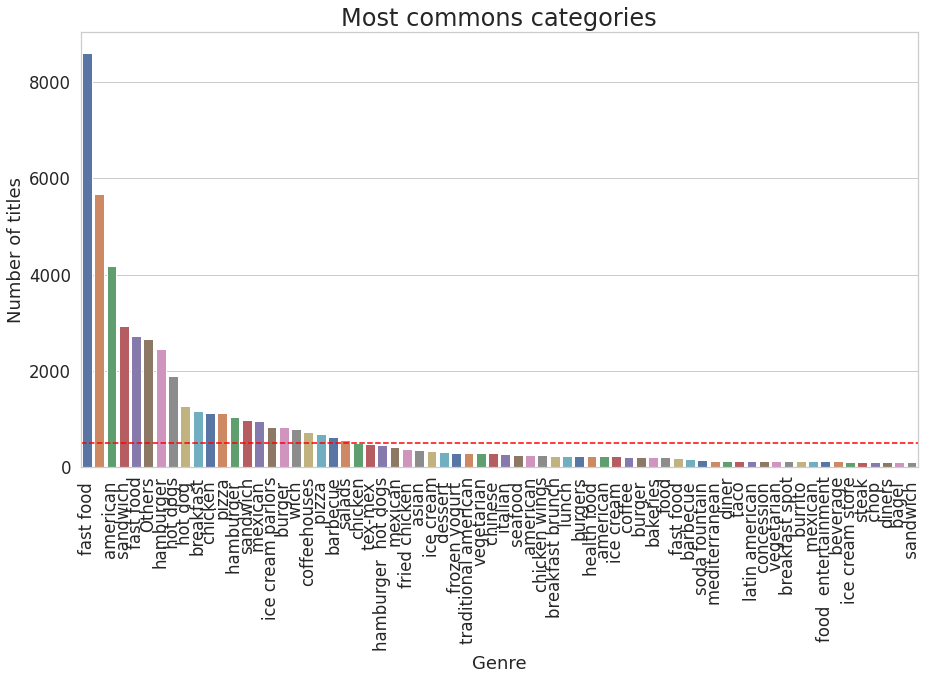

In [ ]:
plt.figure(figsize=(15,8))
sns.set(font_scale = 1.5)
sns.set_style('whitegrid') 


pal = sns.color_palette("deep", len(most_common_cat))
rank = most_common_cat['count'].argsort().argsort()  

sns.barplot(most_common_cat['cat'], most_common_cat['count'], palette=np.array(pal[::-1])[rank])
plt.axhline(threshold, ls='--', c='red')
plt.title("Most commons categories", fontsize=24)
plt.ylabel('Number of titles', fontsize=18)
plt.xlabel('Genre', fontsize=18)
plt.xticks(rotation='vertical')

plt.show()

In [ ]:
rowSums = new_df.iloc[:,1:].sum(axis=1)
multiLabel_counts = rowSums.value_counts()   

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



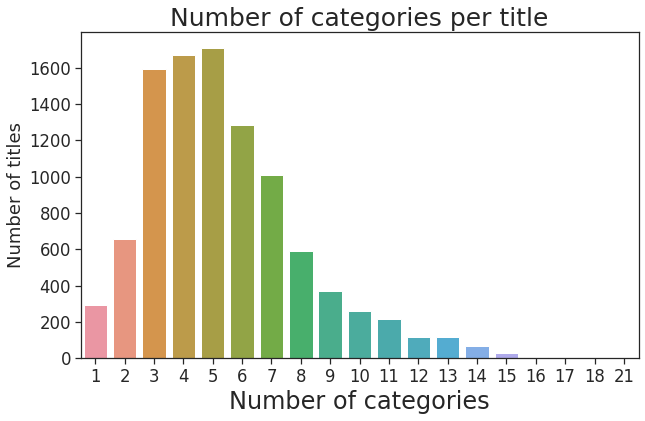

In [ ]:
sns.set(font_scale = 1.5)
sns.set_style('ticks') 
plt.figure(figsize=(10,6))

sns.barplot(multiLabel_counts.index, multiLabel_counts.values)
plt.title("Number of categories per title", fontsize=25)
plt.ylabel('Number of titles', fontsize=18)
plt.xlabel('Number of categories', fontsize=24)

plt.show()

In [ ]:
boxplot = new_df.copy()
boxplot['len'] = new_df.detailed_address.apply(lambda x: len(x))

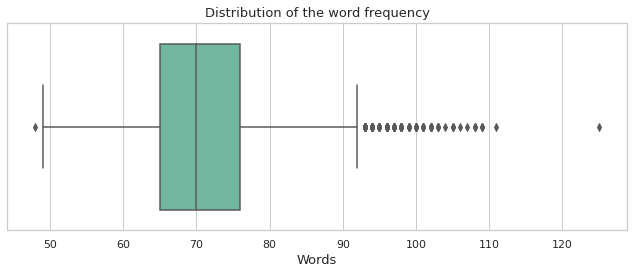

In [ ]:
sns.set(style="whitegrid",rc={"font.size":13,"axes.labelsize":13})

plt.figure(figsize=(9, 4))

ax = sns.boxplot(x='len', data=boxplot, orient="h", palette="Set2")
plt.ylabel('')
plt.xlabel('Words')
plt.title("Distribution of the word frequency", fontsize=13)
plt.tight_layout(h_pad=3)

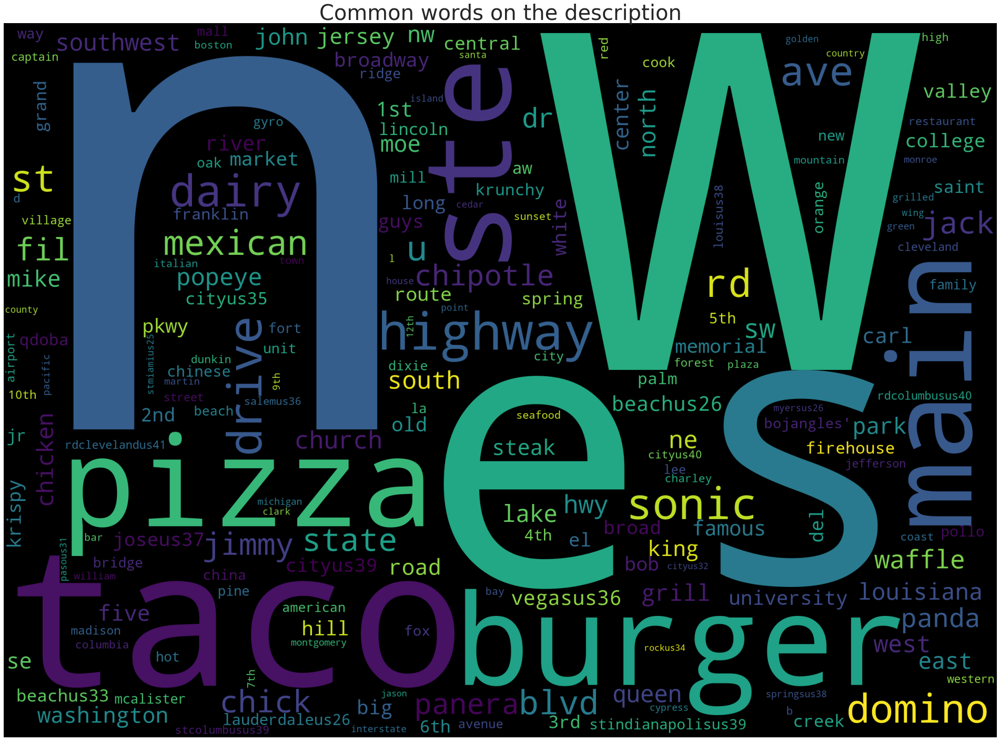

In [ ]:
from wordcloud import WordCloud,STOPWORDS

plt.figure(figsize=(40,25))
text = new_df.detailed_address.values
cloud = WordCloud(
                          stopwords=STOPWORDS,
                          background_color='black',
                          collocations=False,
                          width=2500,
                          height=1800
                         ).generate(" ".join(text))
plt.axis('off')
plt.title("Common words on the description",fontsize=40)
plt.imshow(cloud)

In [ ]:
columns=['OneVsAll', 'BinaryRelevance', 'ClassifierChain', 'MultipleOutput','DNN', 'CNN', 'LSTM']
results = pd.DataFrame(columns = columns)
results

,OneVsAll,BinaryRelevance,ClassifierChain,MultipleOutput,DNN,CNN,LSTM


In [ ]:
seeds = [1, 42, 678, 90, 135]

In [ ]:
t = results.copy()
t

# Preprocessing

# Train-test Split

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(new_df['detailed_address'], 
                                                    new_df[new_df.columns[1:]], 
                                                    test_size=0.3, 
                                                    random_state=seeds[4], 
                                                    shuffle=True)
vectorizer = TfidfVectorizer(strip_accents='unicode', analyzer='word', ngram_range=(1,3), norm='l2')
vectorizer.fit(X_train)

X_train = vectorizer.transform(X_train)
X_test = vectorizer.transform(X_test)

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import accuracy_score
from sklearn.multiclass import OneVsRestClassifier


LR_pipeline = Pipeline([('clf', OneVsRestClassifier(LogisticRegression(solver='sag'), n_jobs=-1))])
accuracy = 0
for category in new_df.columns[1:]:
    print('**Processing {} titles...**'.format(category))
    
    # Training logistic regression model on train data
    LR_pipeline.fit(X_train, y_train[category])
    
    # calculating test accuracy
    prediction = LR_pipeline.predict(X_test)
    accuracy = accuracy + accuracy_score(y_test[category], prediction)
    print('AUC ROC score is {}'.format(roc_auc_score(y_test[category],prediction)))
    print("\n")

print('Test averaged AUC ROC is {}'.format(accuracy/len(new_df.columns[1:])))

**Processing   titles...**
AUC ROC score is 0.7308883799531043


**Processing  american  titles...**
AUC ROC score is 0.5


**Processing  beverage titles...**
AUC ROC score is 0.5


**Processing  burger  titles...**
AUC ROC score is 0.5


**Processing  chop  titles...**
AUC ROC score is 0.5


**Processing  fast food  titles...**
AUC ROC score is 0.5


**Processing  hot dogs titles...**
AUC ROC score is 0.7089053803339518


**Processing  lunch  titles...**
AUC ROC score is 0.5452841296399578


**Processing  mexican  titles...**
AUC ROC score is 0.5


**Processing  sandwich  titles...**
AUC ROC score is 0.5


**Processing american titles...**
AUC ROC score is 0.5


**Processing american  titles...**
AUC ROC score is 0.6978237865652309


**Processing asian  titles...**
AUC ROC score is 0.5522850786008681


**Processing bagel  titles...**
AUC ROC score is 0.5185185185185185


**Processing bakeries titles...**
AUC ROC score is 0.64671972553009


**Processing barbecue titles...**
AUC ROC sco

In [ ]:
from sklearn.naive_bayes import MultinomialNB

NB_pipeline = Pipeline([('clf', OneVsRestClassifier(MultinomialNB(
                    fit_prior=True, class_prior=None)))])
accuracy = 0
for category in new_df.columns[1:]:
    print('**Processing {} titles...**'.format(category))
    
    # Training logistic regression model on train data
    NB_pipeline.fit(X_train, y_train[category])
    
    # calculating test accuracy
    prediction = NB_pipeline.predict(X_test)
    accuracy = accuracy + accuracy_score(y_test[category], prediction)
    print('AUC ROC is {}'.format(roc_auc_score(y_test[category],prediction)))
    print("\n")

print('Test averaged AUC ROC is {}'.format(accuracy/len(new_df.columns[1:])))

**Processing   titles...**
AUC ROC is 0.6919229586834288


**Processing  american  titles...**
AUC ROC is 0.5


**Processing  beverage titles...**
AUC ROC is 0.5


**Processing  burger  titles...**
AUC ROC is 0.5


**Processing  chop  titles...**
AUC ROC is 0.5


**Processing  fast food  titles...**
AUC ROC is 0.5


**Processing  hot dogs titles...**
AUC ROC is 0.5072727272727273


**Processing  lunch  titles...**
AUC ROC is 0.5


**Processing  mexican  titles...**
AUC ROC is 0.5


**Processing  sandwich  titles...**
AUC ROC is 0.5


**Processing american titles...**
AUC ROC is 0.5


**Processing american  titles...**
AUC ROC is 0.6200819399574465


**Processing asian  titles...**
AUC ROC is 0.5


**Processing bagel  titles...**
AUC ROC is 0.5


**Processing bakeries titles...**
AUC ROC is 0.5


**Processing barbecue titles...**
AUC ROC is 0.5


**Processing barbecue  titles...**
AUC ROC is 0.5


**Processing breakfast titles...**
AUC ROC is 0.5


**Processing breakfast brunch titles..

In [ ]:
from sklearn.svm import LinearSVC

SVC_pipeline = Pipeline([('clf', OneVsRestClassifier(LinearSVC(), n_jobs=1))])

accuracy = 0
for category in new_df.columns[1:]:
    print('**Processing {} titles...**'.format(category))
    
    # Training logistic regression model on train data
    SVC_pipeline.fit(X_train, y_train[category])
    
    # calculating test accuracy
    prediction = SVC_pipeline.predict(X_test)
    accuracy = accuracy + roc_auc_score(y_test[category], prediction)
    print('F1-score is {}'.format(roc_auc_score(y_test[category],prediction)))
    print("\n")

print('Test averaged f1-score is {}'.format(accuracy/len(new_df.columns[1:])))

**Processing   titles...**
F1-score is 0.7394562067629441


**Processing  american  titles...**
F1-score is 0.523553616606827


**Processing  beverage titles...**
F1-score is 0.5


**Processing  burger  titles...**
F1-score is 0.5202018051771118


**Processing  chop  titles...**
F1-score is 0.5626636534512544


**Processing  fast food  titles...**
F1-score is 0.49983085250338294


**Processing  hot dogs titles...**
F1-score is 0.7921892393320965


**Processing  lunch  titles...**
F1-score is 0.7164590692198055


**Processing  mexican  titles...**
F1-score is 0.5208885498344488


**Processing  sandwich  titles...**
F1-score is 0.5361961355906866


**Processing american titles...**
F1-score is 0.49982847341337905


**Processing american  titles...**
F1-score is 0.7142255764683209


**Processing asian  titles...**
F1-score is 0.7352828537039063


**Processing bagel  titles...**
F1-score is 0.9601038980453713


**Processing bakeries titles...**
F1-score is 0.8913091177467934


**Processing

In [ ]:
from sklearn.multiclass import OneVsRestClassifier
from sklearn.ensemble import RandomForestClassifier

RF_pipeline = Pipeline([('clf', OneVsRestClassifier(RandomForestClassifier(), n_jobs=1))])

accuracy = 0
for category in new_df.columns[1:]:
    print('**Processing {} titles...**'.format(category))
    
    # Training logistic regression model on train data
    RF_pipeline.fit(X_train, y_train[category])
    
    # calculating test accuracy
    prediction = RF_pipeline.predict(X_test)
    accuracy = accuracy + roc_auc_score(y_test[category], prediction)
    print('AUC ROC is {}'.format(roc_auc_score(y_test[category],prediction)))
    print("\n")

print('Test averaged AUC ROC is {}'.format(accuracy/len(new_df.columns[1:])))

**Processing   titles...**
AUC ROC is 0.7205533251717657


**Processing  american  titles...**
AUC ROC is 0.5


**Processing  beverage titles...**
AUC ROC is 0.5


**Processing  burger  titles...**
AUC ROC is 0.5


**Processing  chop  titles...**
AUC ROC is 0.5


**Processing  fast food  titles...**
AUC ROC is 0.5


**Processing  hot dogs titles...**
AUC ROC is 0.5701298701298702


**Processing  lunch  titles...**
AUC ROC is 0.5227272727272727


**Processing  mexican  titles...**
AUC ROC is 0.5


**Processing  sandwich  titles...**
AUC ROC is 0.5


**Processing american titles...**
AUC ROC is 0.5


**Processing american  titles...**
AUC ROC is 0.671491662817437


**Processing asian  titles...**
AUC ROC is 0.5263157894736842


**Processing bagel  titles...**
AUC ROC is 0.5


**Processing bakeries titles...**
AUC ROC is 0.5


**Processing barbecue titles...**
AUC ROC is 0.5412726510887844


**Processing barbecue  titles...**
AUC ROC is 0.5094339622641509


**Processing breakfast titles..

In [ ]:
results.loc[4,'OneVsAll'] = accuracy/len(new_df.columns[1:])
results

,OneVsAll,BinaryRelevance,ClassifierChain,MultipleOutput,DNN,CNN,LSTM
4,0.54276,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
!pip install scikit-multilearn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from skmultilearn.problem_transform import BinaryRelevance
from sklearn.naive_bayes import GaussianNB
from sklearn.pipeline import Pipeline

#classifier =  Pipeline([('clf', BinaryRelevance(GaussianNB(), n_jobs=1))])
classifier = BinaryRelevance(GaussianNB())
classifier.fit(X_train, y_train)
predictions = classifier.predict(X_test)
accuracy_score(y_test,predictions)
print('AUC ROC is {}'.format(roc_auc_score(y_test,predictions.toarray())))

In [ ]:
%%time

# using binary relevance
from skmultilearn.problem_transform import BinaryRelevance
from sklearn.naive_bayes import GaussianNB

# initialize binary relevance multi-label classifier
# with a gaussian naive bayes base classifier
classifier = BinaryRelevance(GaussianNB())

# train
classifier.fit(X_train, y_train)

# predict
predictions = classifier.predict(X_test)

# accuracy
print("Accuracy = ",accuracy_score(y_test,predictions))
print("\n")

In [ ]:
results.loc[4,'BinaryRelevance'] = roc_auc_score(y_test,predictions.toarray())
results

In [ ]:
from skmultilearn.problem_transform import ClassifierChain
from sklearn.linear_model import LogisticRegression

classifier = ClassifierChain(LogisticRegression())
classifier.fit(X_train, y_train)
predictions = classifier.predict(X_test)

print('AUC ROC is {}'.format(roc_auc_score(y_test,predictions.toarray())))

NameError: ignored

# Deep Learning

Word Embedding

In [ ]:
new_df['detailed_address']

NameError: ignored

In [ ]:
from sklearn.model_selection import train_test_split

train, test = train_test_split(new_df, random_state=42, test_size=0.30, shuffle=True)

print(train.shape)
print(test.shape)

NameError: ignored

In [ ]:
train_text = train['detailed_address']
test_text = test['detailed_address']

# Model building

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(strip_accents='unicode', analyzer='word', ngram_range=(1,3), norm='l2')
vectorizer.fit(train_text)
vectorizer.fit(test_text)

TfidfVectorizer(ngram_range=(1, 3), strip_accents='unicode')

In [ ]:
x_train = vectorizer.transform(train_text)
y_train = train.drop(labels = ['detailed_address'], axis=1)

x_test = vectorizer.transform(test_text)
y_test = test.drop(labels = ['detailed_address'], axis=1)

# Multiple Binary Classifications

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score
from sklearn.multiclass import OneVsRestClassifier

In [ ]:
%%time

# Using pipeline for applying logistic regression and one vs rest classifier
LogReg_pipeline = Pipeline([
                ('clf', OneVsRestClassifier(LogisticRegression(solver='sag'), n_jobs=-1)),
            ])

for category in categories:
    print('**Processing {} comments...**'.format(category))
    
    # Training logistic regression model on train data
    LogReg_pipeline.fit(x_train, train[category])
    
    # calculating test accuracy
    prediction = LogReg_pipeline.predict(x_test)
    print('Test accuracy is {}'.format(accuracy_score(test[category], prediction)))
    print("\n")

**Processing fast food  comments...**
Test accuracy is 0.8566666666666667


**Processing   comments...**
Test accuracy is 0.7353333333333333


**Processing american  comments...**
Test accuracy is 0.6766666666666666


**Processing sandwich  comments...**
Test accuracy is 0.7346666666666667


**Processing fast food comments...**
Test accuracy is 0.729


**Processing hamburger comments...**
Test accuracy is 0.765


**Processing  hot dogs comments...**
Test accuracy is 0.8156666666666667


**Processing hot dog  comments...**
Test accuracy is 0.8853333333333333


**Processing breakfast comments...**
Test accuracy is 0.8933333333333333


**Processing chicken  comments...**
Test accuracy is 0.9006666666666666


**Processing pizza comments...**
Test accuracy is 0.8856666666666667


**Processing hamburger  comments...**
Test accuracy is 0.9046666666666666


**Processing sandwich comments...**
Test accuracy is 0.9023333333333333


**Processing mexican  comments...**
Test accuracy is 0.903333333